# FU Ori Sub Interface HBC 722 Updated

### Caltech Summer 2019

Latest version as of 22 January 2020.

### Imports 

In [1]:
import numpy as np
from scipy import optimize
from scipy import interpolate
from scipy import integrate
import scipy.signal as signal
from astropy.convolution import convolve, convolve_fft
import matplotlib.pyplot as plt
from fu_ori_functions_oct11_copy import *
from fu_ori_classes_oct11_copy import *
import matplotlib.gridspec as gridspec
from PyAstronomy import pyasl
import spectres

### Constants (astronomy is in cgs, right?)

In [2]:
G = 6.67259e-8
SIG_SB = 5.67051e-5
M_SUN = 1.99e33
R_SUN = 6.96e10
L_SUN = 3.839e33
h_PLANCK = 6.6260755e-27
c_LIGHT = 2.99792458e10
k_BOLTZ = 1.380658e-16
sec_YEAR = 365*24*60*60

In [3]:
DIREC = '/Users/tonyrodriguez/Documents/Docs/2019 Summer/Stellar Atmospheres/'

In [4]:
ATM_TABLE = dict()
ATMOS_FACTOR = 100

In [5]:
def direcToArray(directory):
    for temp in range(2000, 10000+ATMOS_FACTOR, ATMOS_FACTOR):
        for grav in [1.5, 4.0]:
            try:
                atmos_file = directory + 'pr.lte' + str(int(temp/ATMOS_FACTOR)) \
                        + '-' + str(grav) + '-0.0.spec'
                txt = open(atmos_file)
                fulltxt = txt.readlines()
                # Cleaning lines
                newtxt = []
                for i in range(len(fulltxt)):
                    line = fulltxt[i][:-1]
                    line = line.split()
                    newtxt.append(line)
        
                # Casting as floats
                newtxt = np.array(newtxt).astype(np.float64)
                
                # Choosing which model to use
                wav, lum = newtxt[:,0], newtxt[:,1]
                ATM_TABLE[(temp, grav)] = np.array([wav, lum])
            except:
                print('No atmosphere found for temp = ' + str(temp) + \
                      ' grav = ' + str(grav))

In [6]:
direcToArray(DIREC)

No atmosphere found for temp = 7100 grav = 1.5
No atmosphere found for temp = 7100 grav = 4.0
No atmosphere found for temp = 7300 grav = 1.5
No atmosphere found for temp = 7300 grav = 4.0
No atmosphere found for temp = 7500 grav = 1.5
No atmosphere found for temp = 7500 grav = 4.0
No atmosphere found for temp = 7700 grav = 1.5
No atmosphere found for temp = 7700 grav = 4.0
No atmosphere found for temp = 7900 grav = 1.5
No atmosphere found for temp = 7900 grav = 4.0
No atmosphere found for temp = 8100 grav = 1.5
No atmosphere found for temp = 8100 grav = 4.0
No atmosphere found for temp = 8300 grav = 1.5
No atmosphere found for temp = 8300 grav = 4.0
No atmosphere found for temp = 8500 grav = 1.5
No atmosphere found for temp = 8500 grav = 4.0
No atmosphere found for temp = 8700 grav = 1.5
No atmosphere found for temp = 8700 grav = 4.0
No atmosphere found for temp = 8900 grav = 1.5
No atmosphere found for temp = 8900 grav = 4.0
No atmosphere found for temp = 9100 grav = 1.5
No atmosphere

## Making an instance of the class FU Ori and testing

In [7]:
r_a_TEST = np.array([1,5,6,7])
r_b_TEST = np.array([5,6,7,8])
temps_TEST = [9000, 8000, 7000, 6000]

In [8]:
def makeMod(r_a, r_b, temps, bins):
    r_a_fin = r_a[1:]
    r_diff = r_b[0] - r_a[0]
    r_split = r_diff/bins
    new_r_vals = np.arange(r_a[0], r_b[0], r_split)
    r_a_new = np.concatenate((new_r_vals, r_a_fin))    
    r_b_new = np.concatenate((r_a_new[1:], [r_b[-1]]))
    temps_new = np.concatenate((temps[0]*np.ones(len(new_r_vals)-1), temps))
    return r_a_new, r_b_new, temps_new

In [9]:
class FUOriEnvironment:
    
    # Initializer / Instance Attributes
    def __init__(self, wave_lower_spec, wave_upper_spec, wave_lower_SED, wave_upper_SED):
        
        self.wave_lower_spec = wave_lower_spec
        self.wave_upper_spec = wave_upper_spec
        self.wave_lower_SED = wave_lower_SED
        self.wave_upper_SED = wave_upper_SED
        
        # Storing classes
        self.fuori = []
        self.rot_star = 0
        self.disk_atm = []
        
        print('Created environment.')
        
    # instance methods
    
    # Creating FU Ori object as accretion disk
    def createFUOri(self, r_star, r_outer, m_star, m_dot, inc, a_v, dist, grav, direc, pl_index, atm_table):
        print('Creating FU Ori object...')
        fuori = FUOri(r_star, r_star, r_outer, m_star, m_dot, np.radians(inc), a_v, pl_index, atm_table)
        print('Creating disk annuli...')
        fuori.setAnnuliValues(10000, 2000, 200, 1*r_star)
#         fuori.r_a, fuori.r_b, fuori.temps = makeMod(fuori.r_a, fuori.r_b, fuori.temps, bins=20)
        print('Reading stellar atmosphere directory...')
        fuori.createAnnuliFromDirec(grav, direc, model='stellar atmospheres')
        print('Preparing annuli for broadening and summing...')
        fuori.prepareAnnuli(self.wave_lower_spec,self.wave_upper_spec, \
                            binning=1, broaden=True, interp_type='linear')
        print('Creating model spectrum...')
        fuori.createModelSpectrum('stellar atmospheres', broaden=True)
        print('FU Ori object created.')
        self.fuori.append(fuori)
    
    # Creating rotating star
    def createRotStar(self, temp, r_star, m_star, inc, a_v, dist, grav, direc, atm_table):
        self.rot_star = Star(temp, grav, m_star, r_star, direc, np.radians(inc), a_v, atm_table) 
        self.rot_star.setSpectrumFromDirec('stellar atmospheres', temp, grav)
        self.rot_star.prepareSpectrum(self.wave_lower_spec, self.wave_upper_spec, 1, 'linear')
        self.rot_star.broadenStellarSpectrum()
        
    def createDiskAtm(self, temp, grav, vsini, direc, atm_table):
        disk_atm = DiskAtmosphere(temp, grav, vsini, direc, atm_table) 
        disk_atm.setSpectrumFromDirec('stellar atmospheres', temp, grav)
        disk_atm.prepareSpectrum(self.wave_lower_spec, self.wave_upper_spec, 1, 'linear')
        disk_atm.broadenDiskAtmSpectrum()
        self.disk_atm.append(disk_atm)
    
    # For viewing model spectrum
    def viewModelSpectrum(self, wave_lower, wave_upper, obj_type, obj_num, broaden, redden):
        if obj_type == 'fu ori':
            return self.fuori[obj_num].viewModelSpectrum(wave_lower, wave_upper, broaden, redden)
        elif obj_type == 'rotating star':
            return self.rot_star.getLuminosity(wave_lower, wave_upper, broaden, redden)
        elif obj_type == 'disk atmosphere':
            return self.disk_atm[obj_num].getLuminosity(wave_lower, wave_upper, 'broadened')
    
    # For viewing model SED
    def viewModelSED(self, wave_lower, wave_upper, broaden):
        waves, lums = self.fuori.viewModelSpectrum(wave_lower, wave_upper, broaden, redden)
        return np.log10(waves*1e-4), np.log10(np.cos(np.radians(self.inc))*waves*1e-8*lums/(2*np.pi*(self.dist**2)))

    # Useful modules
    def viewFracLums(self, wave_lower, wave_upper, obj_num, data_type, x_axis_type):
        return self.fuori[obj_num].calculateFracLums(wave_lower, wave_upper, data_type, x_axis_type)
    
    def viewGravComparison(self, obj_nums, wave_lower, wave_upper, broaden, redden):
        obj_n1, obj_n2 = obj_nums
        wav, lum1 = self.viewModelSpectrum(wave_lower, wave_upper, 'fu ori', obj_n1, broaden, redden)
        wav, lum2 = self.viewModelSpectrum(wave_lower, wave_upper, 'fu ori', obj_n2, broaden, redden)
        lum_diff = np.abs(lum2 - lum1)
        return wav, lum_diff    

In [10]:
PARAMS = [0.56, 1.39, -5.41, 3.16, 30, 0]
PARAMS_2 = [0.56, 1.39, -4.82, 4.8, 30, 0]
PARAMS_3 = [0.56, 1.39, -6, 1., 30, 0]
# PARAMS_4 = [0.56, 1.39, -6, 2.8, 30, 0]

# PARAMS = [0.56, 1.39, -5.41, 3.16, 30, -1.1]
# PARAMS_2 = [0.56, 1.39, -5.41, 3.16, 30, 0]
# PARAMS_3 = [0.56, 1.39, -5.41, 3.16, 30, +1.1]

In [11]:
def t_max(mass, radius, acc_rate):
    return 13000*(mass)**(1/4)*(10**acc_rate/1e-5)**(1/4)*(radius)**(-3/4)

def v_max(mass, radius, inc):
    return np.sqrt(G*mass*M_SUN/(radius*R_SUN))*np.sin(np.radians(inc))*1e-5

def lum_max(mass, radius, acc_rate):
    return G*mass*M_SUN*(10**acc_rate * M_SUN/sec_YEAR)/(2*radius*R_SUN)/L_SUN

In [12]:
t_max(PARAMS[0], PARAMS[1], PARAMS[2]), t_max(PARAMS_2[0], PARAMS_2[1], PARAMS_2[2]), \
t_max(PARAMS_3[0], PARAMS_3[1], PARAMS_3[2])

(6937.919538481753, 9743.820142119188, 4940.026275154339)

In [89]:
# gaia17bpi_env = FUOriEnvironment(3.85e3, 4.45e3, 0, 0)
gaia17bpi_env = FUOriEnvironment(4.15e3, 4.75e3, 0, 0)


R_OUTER = 200*R_SUN
DIST = 795*3.08567758128e18
# Spectrum fit
%time gaia17bpi_env.createFUOri(r_star = PARAMS[1]*R_SUN, r_outer = R_OUTER, m_star = PARAMS[0]*M_SUN,\
                          m_dot = (10**PARAMS[2]) * M_SUN / 3.154e7, inc = PARAMS[4],\
                                a_v = PARAMS[3],dist = DIST, grav = 1.5, \
                                direc = DIREC, pl_index = PARAMS[5], atm_table=ATM_TABLE)
%time gaia17bpi_env.createFUOri(r_star = PARAMS_2[1]*R_SUN, r_outer = R_OUTER, m_star = PARAMS_2[0]*M_SUN,\
                          m_dot = (10**PARAMS_2[2]) * M_SUN / 3.154e7, inc = PARAMS_2[4],\
                                a_v = PARAMS_2[3],dist = DIST, grav = 1.5, \
                                direc = DIREC, pl_index = PARAMS_2[5], atm_table=ATM_TABLE)
%time gaia17bpi_env.createFUOri(r_star = PARAMS_3[1]*R_SUN, r_outer = R_OUTER, m_star = PARAMS_3[0]*M_SUN,\
                          m_dot = (10**PARAMS_3[2]) * M_SUN / 3.154e7, inc = PARAMS_3[4],\
                                a_v = PARAMS_3[3],dist = DIST, grav = 1.5, \
                                direc = DIREC, pl_index = PARAMS_3[5], atm_table=ATM_TABLE)





Created environment.
Creating FU Ori object...
Creating disk annuli...
Reading stellar atmosphere directory...
Used stellar atmosphere at T = 7000.
Used stellar atmosphere at T = 7000.
Used stellar atmosphere at T = 6800.
Used stellar atmosphere at T = 6600.
Used stellar atmosphere at T = 6400.
Used stellar atmosphere at T = 6200.
Used stellar atmosphere at T = 6000.
Used stellar atmosphere at T = 5800.
Used stellar atmosphere at T = 5600.
Used stellar atmosphere at T = 5400.
Used stellar atmosphere at T = 5200.
Used stellar atmosphere at T = 5000.
Used stellar atmosphere at T = 4800.
Used stellar atmosphere at T = 4600.
Used stellar atmosphere at T = 4400.
Used stellar atmosphere at T = 4200.
Used stellar atmosphere at T = 4000.
Used stellar atmosphere at T = 3800.
Used stellar atmosphere at T = 3600.
Used stellar atmosphere at T = 3400.
Used stellar atmosphere at T = 3200.
Used stellar atmosphere at T = 3000.
Used stellar atmosphere at T = 2800.
Used stellar atmosphere at T = 2600.
U

/Users/tonyrodriguez/Documents/Docs/2019 Summer/Jupyter Notebooks/fu_ori_functions_oct11_copy.py:212: RuntimeWarning: overflow encountered in exp
  term2 = (np.exp(h_PLANCK*c_LIGHT/(wavelength*k_BOLTZ*temp))-1)**(-1)


No stellar atmosphere for annulus of T = 581. Used blackbody.
No stellar atmosphere for annulus of T = 575. Used blackbody.
No stellar atmosphere for annulus of T = 569. Used blackbody.
No stellar atmosphere for annulus of T = 563. Used blackbody.
No stellar atmosphere for annulus of T = 558. Used blackbody.
No stellar atmosphere for annulus of T = 552. Used blackbody.
No stellar atmosphere for annulus of T = 547. Used blackbody.
No stellar atmosphere for annulus of T = 541. Used blackbody.
No stellar atmosphere for annulus of T = 536. Used blackbody.
No stellar atmosphere for annulus of T = 531. Used blackbody.
No stellar atmosphere for annulus of T = 526. Used blackbody.
No stellar atmosphere for annulus of T = 521. Used blackbody.
No stellar atmosphere for annulus of T = 516. Used blackbody.
No stellar atmosphere for annulus of T = 512. Used blackbody.
No stellar atmosphere for annulus of T = 507. Used blackbody.
No stellar atmosphere for annulus of T = 503. Used blackbody.
No stell

No stellar atmosphere for annulus of T = 687. Used blackbody.
No stellar atmosphere for annulus of T = 682. Used blackbody.
No stellar atmosphere for annulus of T = 676. Used blackbody.
No stellar atmosphere for annulus of T = 670. Used blackbody.
No stellar atmosphere for annulus of T = 665. Used blackbody.
No stellar atmosphere for annulus of T = 660. Used blackbody.
No stellar atmosphere for annulus of T = 654. Used blackbody.
No stellar atmosphere for annulus of T = 649. Used blackbody.
No stellar atmosphere for annulus of T = 644. Used blackbody.
No stellar atmosphere for annulus of T = 639. Used blackbody.
No stellar atmosphere for annulus of T = 634. Used blackbody.
No stellar atmosphere for annulus of T = 630. Used blackbody.
No stellar atmosphere for annulus of T = 625. Used blackbody.
No stellar atmosphere for annulus of T = 620. Used blackbody.
No stellar atmosphere for annulus of T = 616. Used blackbody.
No stellar atmosphere for annulus of T = 611. Used blackbody.
No stell

No stellar atmosphere for annulus of T = 390. Used blackbody.
No stellar atmosphere for annulus of T = 386. Used blackbody.
No stellar atmosphere for annulus of T = 382. Used blackbody.
No stellar atmosphere for annulus of T = 379. Used blackbody.
No stellar atmosphere for annulus of T = 375. Used blackbody.
No stellar atmosphere for annulus of T = 372. Used blackbody.
No stellar atmosphere for annulus of T = 368. Used blackbody.
No stellar atmosphere for annulus of T = 365. Used blackbody.
No stellar atmosphere for annulus of T = 362. Used blackbody.
No stellar atmosphere for annulus of T = 358. Used blackbody.
No stellar atmosphere for annulus of T = 355. Used blackbody.
No stellar atmosphere for annulus of T = 352. Used blackbody.
No stellar atmosphere for annulus of T = 349. Used blackbody.
No stellar atmosphere for annulus of T = 346. Used blackbody.
No stellar atmosphere for annulus of T = 343. Used blackbody.
No stellar atmosphere for annulus of T = 341. Used blackbody.
No stell

# HBC 722 Data

In [5]:
PATH = '/Users/tonyrodriguez/Documents/Docs/2019 Summer/Data/HBC 722/'

DIST = 795*3.08567758128e18

In [6]:
def getDataArray(data_file):
    txt = open(data_file)
    fulltxt = txt.readlines()
    # Cleaning lines
    newtxt = []
    for i in range(len(fulltxt)):
        line = fulltxt[i][:-1]
        line = line.split()
        if line[0] == '#':
            line = [line[1], line[2]]
        newtxt.append(line)
    # Casting as floats
    newtxt = np.array(newtxt).astype(np.float64)
    return newtxt

In [7]:
newtxt3 = getDataArray(PATH + 'PTF10qpf.y.txt')

wavesDATA_INF1 = newtxt3[:,0][10:]*1e4
fluxesDATA_INF1 = newtxt3[:,1][10:]/16

newtxt4 = getDataArray(PATH + 'PTF10qpf.j.txt')

wavesDATA_INF2 = newtxt4[:,0][10:]*1e4
fluxesDATA_INF2 = newtxt4[:,1][10:]/16

newtxt5 = getDataArray(PATH + 'PTF10qpf.h.txt')

wavesDATA_INF3 = newtxt5[:,0][10:]*1e4
fluxesDATA_INF3 = newtxt5[:,1][10:]/16

newtxt6 = getDataArray(PATH + 'PTF10qpf.k.txt')

wavesDATA_INF4 = newtxt6[:,0][10:]*1e4
fluxesDATA_INF4 = newtxt6[:,1][10:]/16


## Reading in Palomar Data

In [8]:
PATH = '/Users/tonyrodriguez/Documents/Docs/2019 Summer/Data/HBC 722/'

def getDataArray(data_file):
    txt = open(data_file)
    fulltxt = txt.readlines()
    # Cleaning lines
    newtxt = []
    for i in range(len(fulltxt)):
        line = fulltxt[i][:-1]
        line = line.split()
        if line[0] == '#':
            line = [line[1], line[2]]
        newtxt.append(line)
    # Casting as floats
    newtxt = np.array(newtxt).astype(np.float64)
    return newtxt

In [9]:
newtxt = getDataArray(PATH + 'hbc722_blue.txt')

waves_pal = newtxt[:,0] 
fluxes_pal = newtxt[:,1]

newtxt2 = getDataArray(PATH + 'hbctxt_new')

waves_pal2 = newtxt2[:,0][10:]
fluxes_pal2 = newtxt2[:,1][10:]


In [20]:
waves_pal[99]/(waves_pal[100] - waves_pal[99])

3667.9758600089326

## Plotting Full FU Ori Model with Data

Recall:
$$F = \dfrac{L^\text{TOT}\cos i}{2\pi d^2}$$

In [95]:
del gaia17bpi_env.disk_atm[0]

IndexError: list assignment index out of range

In [96]:
ATM_GRAVS = 1.5

In [97]:
gaia17bpi_env.createDiskAtm(8000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)
gaia17bpi_env.createDiskAtm(7000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)
gaia17bpi_env.createDiskAtm(6000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)
gaia17bpi_env.createDiskAtm(5000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)
gaia17bpi_env.createDiskAtm(4000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)
gaia17bpi_env.createDiskAtm(3000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)

gaia17bpi_env.createDiskAtm(9000, ATM_GRAVS, 180*1e5, DIREC, ATM_TABLE)


Used stellar atmosphere at T = 8000.
Used stellar atmosphere at T = 7000.
Used stellar atmosphere at T = 6000.
Used stellar atmosphere at T = 5000.
Used stellar atmosphere at T = 4000.
Used stellar atmosphere at T = 3000.
Used stellar atmosphere at T = 9000.


In [98]:
gaia17bpi_env.createRotStar(temp = 7000, r_star = 2*R_SUN, m_star = 1*M_SUN, inc = 60, \
                            a_v = 3.16, dist = DIST, grav = 1.5, direc = DIREC, atm_table=ATM_TABLE)

Used stellar atmosphere at T = 7000.


In [99]:
gaia17bpi_env.fuori[0].annuli[0].temp, gaia17bpi_env.fuori[1].annuli[0].temp, gaia17bpi_env.fuori[2].annuli[0].temp

(7000.0, 9800.0, 5000.0)

In [100]:
gaia17bpi_env.fuori[0].getTotalLum()/L_SUN, gaia17bpi_env.fuori[1].getTotalLum()/L_SUN

(24.56180330214571, 95.38783491904445)

## Full-resolution models and data

In [101]:
START =4000
END = 4700
wav, lum = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 0, True, False)
flux  = pyasl.unred(wav, lum*np.cos(gaia17bpi_env.fuori[0].inc)/(2*np.pi*DIST**2), -gaia17bpi_env.fuori[0].a_v/3.1)

wav2, lum2 = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 1, True, False)
flux2  = pyasl.unred(wav2, lum2*np.cos(gaia17bpi_env.fuori[1].inc)/(2*np.pi*DIST**2), -gaia17bpi_env.fuori[1].a_v/3.1)

wav3, lum3 = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 2, True, False)
flux3  = pyasl.unred(wav3, lum3*np.cos(gaia17bpi_env.fuori[2].inc)/(2*np.pi*DIST**2), -gaia17bpi_env.fuori[2].a_v/3.1)

wav_ATM, lum_ATM = gaia17bpi_env.disk_atm[0].wavelengths_interp,  gaia17bpi_env.disk_atm[0].lums_broad
wav_ATM1, lum_ATM1 = gaia17bpi_env.disk_atm[1].wavelengths_interp,  gaia17bpi_env.disk_atm[1].lums_broad
wav_ATM2, lum_ATM2 = gaia17bpi_env.disk_atm[2].wavelengths_interp,  gaia17bpi_env.disk_atm[2].lums_broad
wav_ATM3, lum_ATM3 = gaia17bpi_env.disk_atm[3].wavelengths_interp,  gaia17bpi_env.disk_atm[3].lums_broad
wav_ATM4, lum_ATM4 = gaia17bpi_env.disk_atm[4].wavelengths_interp,  gaia17bpi_env.disk_atm[4].lums_broad
wav_ATM5, lum_ATM5 = gaia17bpi_env.disk_atm[5].wavelengths_interp,  gaia17bpi_env.disk_atm[5].lums_broad

wav_ATM6, lum_ATM6 = gaia17bpi_env.disk_atm[6].wavelengths_interp,  gaia17bpi_env.disk_atm[6].lums_broad




# wav_ATM22, lum_ATM22 = gaia17bpi_env.disk_atm[2].wavelengths_interp,  gaia17bpi_env.disk_atm[2].lums_interp




In [102]:
wav_STAR, lum_STAR = gaia17bpi_env.rot_star.wavelengths_interp,  gaia17bpi_env.rot_star.lums_broad

In [103]:
np.sqrt(G*PARAMS[0]*M_SUN/(PARAMS[1]*R_SUN))/1e5

277.2399117363067

In [104]:
OFF = -0.8e-14*np.ones(len(wav_ATM))
OFF_SPEC = -0.2e-14*np.ones(len(wav))

### Quick test

In [105]:
test_radii = gaia17bpi_env.fuori[0].r_b
test_speeds = np.sqrt(G*gaia17bpi_env.fuori[0].m_star/test_radii)*1e-5
test_temps = gaia17bpi_env.fuori[0].temps

In [106]:
import csv
with open('hbc722_vel_temps', 'w') as f:
    writer = csv.writer(f, delimiter=' ')
    writer.writerows(zip(test_radii, test_speeds, test_temps))

### End quick test

### Data Cleaning

In [107]:
WAV_SCALE, VAL_SCALE = getDataArray('flux_calibrator.csv')[:,0], getDataArray('flux_calibrator.csv')[:,1]

In [108]:
interp_func = interpolate.interp1d(WAV_SCALE, VAL_SCALE)
correction = interp_func(waves_pal[20:-20])

wav_correct = waves_pal[20:-20]
flux_correct = fluxes_pal[20:-20]*correction

data_resamp = spectres.spectres(wav, wav_correct, flux_correct)

In [109]:
correction

array([2.20888666, 2.20697555, 2.20506668, ..., 0.92754825, 0.92691399,
       0.92627844])

In [110]:
WAV_SCALE

array([3853.78618702, 3854.8647071 , 3855.94322718, ..., 6821.87344061,
       6822.95196069, 6824.03048076])

In [111]:
waves_pal2[340:-3500]

array([3858.43705688, 3859.46116275, 3860.48526863, ..., 6413.58121947,
       6414.60532535, 6415.62943123])

In [112]:
data_resamp = spectres.spectres(wav, waves_pal2, 0.7*fluxes_pal2)

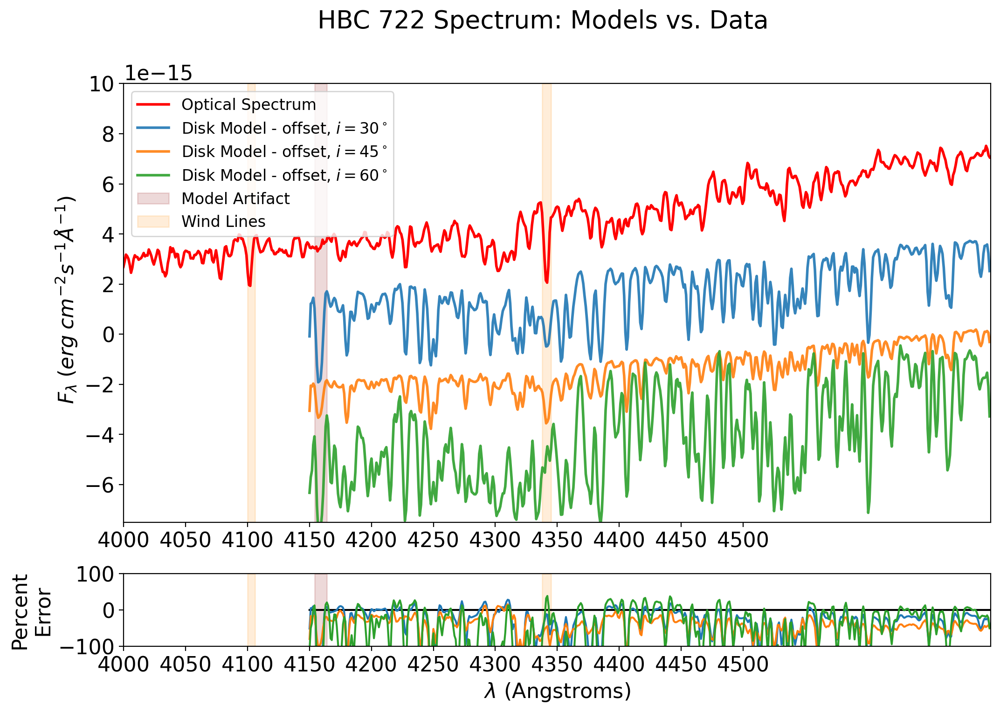

In [113]:
fig=plt.figure(figsize=(12, 8), dpi= 200)
gs = gridspec.GridSpec(2, 1,height_ratios=[6,1])


ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])


plt.rcParams.update({'font.size': 16})
plt.suptitle('HBC 722 Spectrum: Models vs. Data')
ax.plot(waves_pal2, 0.7*fluxes_pal2,'r', lw=2, label='Optical Spectrum')
# ax.plot(wav_correct, flux_correct,'r', lw=2, label='Optical Spectrum')



ax.plot(wav, flux*1e-8 + 1.2*OFF_SPEC, lw=2, alpha=0.9,label=r'Disk Model - offset, $i = 30^\circ$')
ax.plot(wav2, flux2*1e-8 + 2.5*OFF_SPEC, lw=2, alpha=0.9,label=r'Disk Model - offset, $i = 45^\circ$')
ax.plot(wav3, flux3*1e-8+ 4*OFF_SPEC, lw=2, alpha=0.9,label=r'Disk Model - offset, $i = 60^\circ$')


ax.axvspan(4154, 4164, color='darkred', alpha=0.15, label = 'Model Artifact')
ax2.axvspan(4154, 4164, color='darkred', alpha=0.15)

ax.axvspan(4338, 4345, color='darkorange', alpha=0.15, label='Wind Lines')
ax.axvspan(4100, 4106, color='darkorange', alpha=0.15)
ax2.axvspan(4100, 4106, color='darkorange', alpha=0.15)
ax2.axvspan(4338, 4345, color='darkorange', alpha=0.15)

# ax2.plot(wav, 2.5*np.log10(flux*1e-8/data_resamp))
# ax2.plot(wav, 2.5*np.log10(flux2*1e-8/data_resamp))
# ax2.plot(wav, 2.5*np.log10(flux3*1e-8/data_resamp))

ax2.plot(wav, np.zeros(len(wav)), 'k')
ax2.plot(wav, 100*(flux*1e-8 - data_resamp)/(flux*1e-8))
ax2.plot(wav2, 100*(flux2*1e-8 - data_resamp)/(flux2*1e-8))
ax2.plot(wav3, 100*(flux3*1e-8 - data_resamp)/(flux3*1e-8))

ax2.set_ylim(-100,100)





ax2.set_xlabel(r'$\lambda$ (Angstroms)')
ax.set_ylabel(r' $F_\lambda\; (erg \;cm^{-2} s^{-1} \AA^{-1})$')
ax2.set_ylabel('Percent\nError')
# ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.legend(fontsize=12)
ax.set_ylim(-0.75e-14,1.0e-14)

ax.set_xlim(START, END)
ax2.set_xlim(START, END)

ax.set_xticks(np.arange(4000, 4550, 50))
ax2.set_xticks(np.arange(4000, 4550, 50))

# plt.savefig('hbc722_spectra_40_45.png', dpi = 200, bbox_inches='tight')
plt.show()

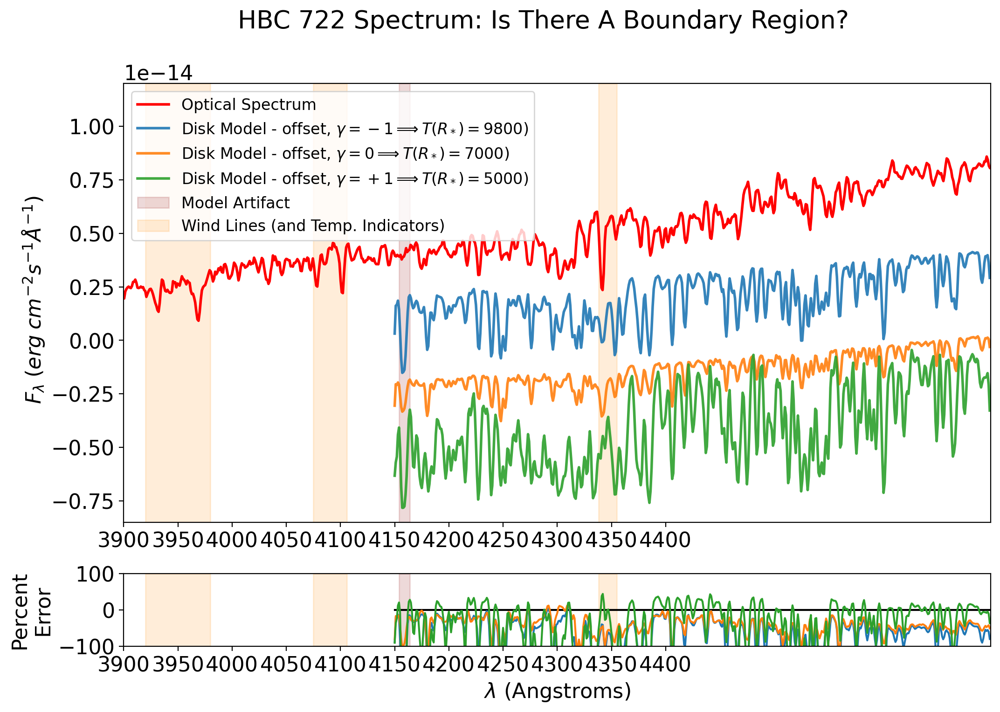

In [114]:
fig=plt.figure(figsize=(12, 8), dpi= 200)
gs = gridspec.GridSpec(2, 1,height_ratios=[6,1])


ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])


plt.suptitle('HBC 722 Spectrum: Is There A Boundary Region?')
ax.plot(waves_pal2, 0.8*fluxes_pal2,'r', lw=2, label='Optical Spectrum')
# plt.plot(waves_pal2, fluxes_pal2,'r', lw=2, label='Optical Spectrum')

ax.plot(wav, flux*1e-8 + OFF_SPEC, lw=2, alpha=0.9,label=r'Disk Model - offset, $\gamma = -1\Longrightarrow T(R_*) = 9800)$')
ax.plot(wav2, flux2*1e-8 + 2.5*OFF_SPEC, lw=2, alpha=0.9,label=r'Disk Model - offset, $\gamma = 0\Longrightarrow T(R_*) = 7000)$')
ax.plot(wav3, flux3*1e-8+ 4*OFF_SPEC, lw=2, alpha=0.9,label=r'Disk Model - offset, $\gamma = +1\Longrightarrow T(R_*) = 5000)$')

# ax2.plot(wav, 2.5*np.log10(0.7*flux*1e-8/data_resamp))
# ax2.plot(wav, 2.5*np.log10(flux2*1e-8/data_resamp))
# ax2.plot(wav, 2.5*np.log10(1.1*flux3*1e-8/data_resamp))

ax2.plot(wav, np.zeros(len(wav)), 'k')
ax2.plot(wav, 100*(0.8*flux*1e-8 - data_resamp)/(0.8*flux*1e-8))
ax2.plot(wav2, 100*(flux2*1e-8 - data_resamp)/(flux2*1e-8))
ax2.plot(wav3, 100*(1.1*flux3*1e-8 - data_resamp)/(1.1*flux3*1e-8))

ax2.set_ylim(-100,100)

ax.axvspan(4154, 4164, color='darkred', alpha=0.15, label = 'Model Artifact')
ax2.axvspan(4154, 4164, color='darkred', alpha=0.15)

ax.axvspan(4338, 4355, color='darkorange', alpha=0.15, label='Wind Lines (and Temp. Indicators)')
ax.axvspan(4075, 4106, color='darkorange', alpha=0.15)
ax.axvspan(3920, 3980, color='darkorange', alpha=0.15)
ax2.axvspan(4338, 4355, color='darkorange', alpha=0.15)
ax2.axvspan(4075, 4106, color='darkorange', alpha=0.15)
ax2.axvspan(3920, 3980, color='darkorange', alpha=0.15)

ax2.set_ylabel('Percent\nError')

ax2.set_xlabel(r'$\lambda$ (Angstroms)')
ax.set_ylabel(r' $F_\lambda\; (erg \;cm^{-2} s^{-1} \AA^{-1})$')
# plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.legend(fontsize=12)
ax.set_ylim(-0.85e-14,1.2e-14)

ax.set_xlim(START, END)
ax2.set_xlim(START, END)

ax.set_xticks(np.arange(3900, 4450, 50))
ax2.set_xticks(np.arange(3900, 4450, 50))

# plt.savefig('hbc722_spectra_boundary.png', dpi = 200, bbox_inches='tight')
plt.show()

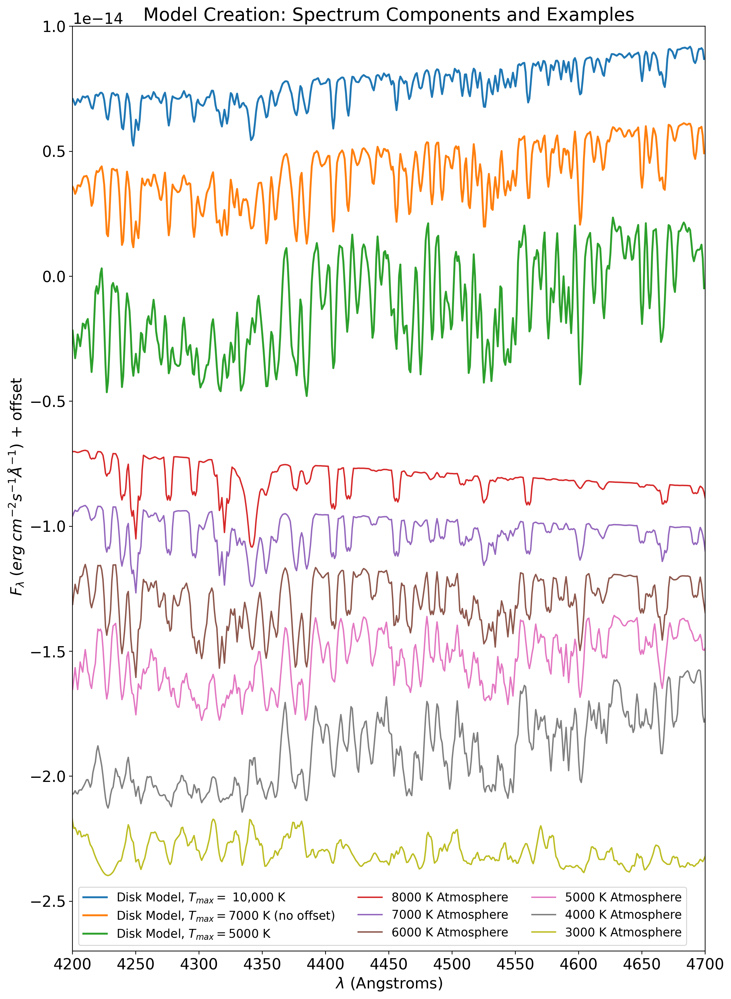

In [119]:
fig=plt.figure(figsize=(12, 18), dpi= 200)
plt.rcParams.update({'font.size': 16})
plt.title('Model Creation: Spectrum Components and Examples')
# plt.plot(waves_pal2, fluxes_pal2,'r', lw=2, label='Optical Spectrum')
plt.plot(wav2, flux2*1e-8 - 2*OFF_SPEC, lw=2, alpha=1,label=r'Disk Model, $T_{max} =$ 10,000 K')
plt.plot(wav, flux*1e-8 + 0*OFF_SPEC, lw=2, alpha=1,label=r'Disk Model, $T_{max} = 7000$ K (no offset)')
plt.plot(wav3, flux3*1e-8 + 2.6*OFF_SPEC, lw=2, alpha=1,label=r'Disk Model, $T_{max} = 5000$ K')





plt.plot(wav_ATM, 0.8e-30*lum_ATM + 1.6*OFF, label='8000 K Atmosphere')
plt.plot(wav_ATM1, 1.4e-30*lum_ATM1 + 1.8*OFF, label='7000 K Atmosphere')
plt.plot(wav_ATM2, 4e-30*lum_ATM2 + 2.2*OFF, label='6000 K Atmosphere')
plt.plot(wav_ATM3, 10e-30*lum_ATM3 + 2.3*OFF, label='5000 K Atmosphere')
plt.plot(wav_ATM4, 0.6e-28*lum_ATM4 + 2.7*OFF, label='4000 K Atmosphere')
plt.plot(wav_ATM5, 1.2e-27*lum_ATM5 + 3.*OFF, label='3000 K Atmosphere')




# plt.axvspan(4140, 4148, color='green', alpha=0.1)


# plt.axvspan(4350, 4365, color='green', alpha=0.1)
# plt.axvspan(4000, 4036, color='green', alpha=0.1)
# plt.axvspan(4195, 4232, color='green', alpha=0.1)

# plt.axvspan(4472, 4488, color='green', alpha=0.1)

plt.xlabel(r'$\lambda$ (Angstroms)')
plt.ylabel(r' $F_\lambda\; (erg \;cm^{-2} s^{-1} \AA^{-1})$ + offset')
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.legend(fontsize=12.5, ncol=3)
plt.ylim(-2.7e-14,1e-14)
plt.xlim(4200, 4700)
plt.xticks(np.arange(4200, 4750, 50))
# plt.savefig('hbc722_model_vs_atmospheres_demo.png', dpi = 200, bbox_inches='tight')
plt.show()

## With residual plot

In [90]:
START = 3710
END = 4190

DATA = waves_pal2, fluxes_pal2
MODEL = wav, 0.6*flux*1e-8

MODEL2 = wav_ATM1, 1.4e-30*lum_ATM1

In [91]:
LOW_LIM_DATA = find_nearest(waves_pal, START, 'below')
HIGH_LIM_DATA = find_nearest(waves_pal,END, 'above')

In [92]:
IND_LOW_DATA = np.searchsorted(DATA[0], LOW_LIM_DATA)
IND_HIGH_DATA = np.searchsorted(DATA[0], HIGH_LIM_DATA)

In [30]:
DATA_CUT = waves_pal2[IND_LOW_DATA: IND_HIGH_DATA+1], fluxes_pal2[IND_LOW_DATA: IND_HIGH_DATA+1]

In [31]:
MODEL_FLUX = spectres.spectres(DATA_CUT[0], MODEL[0], MODEL[1])
MODEL2_FLUX = spectres.spectres(DATA_CUT[0], MODEL2[0], MODEL2[1])

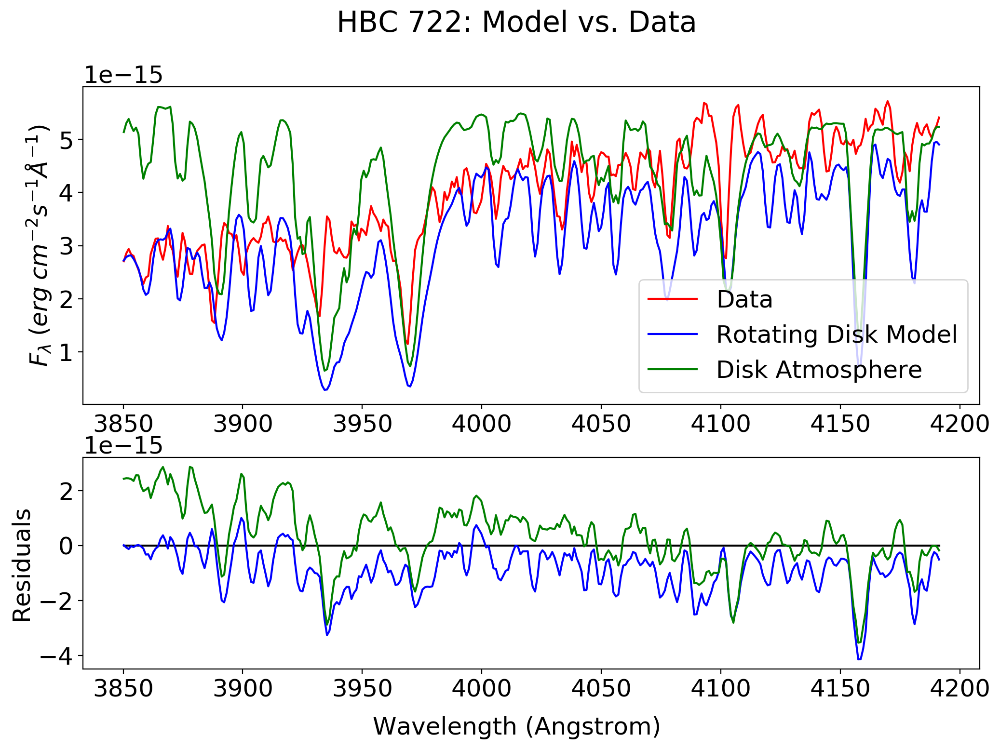

In [32]:
fig=plt.figure(figsize=(12, 8), dpi= 200)
gs = gridspec.GridSpec(2, 1,height_ratios=[3, 2])
plt.rcParams.update({'font.size': 18})

ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax.plot(DATA_CUT[0], DATA_CUT[1], 'r-',label='Data')
ax.plot(DATA_CUT[0], MODEL_FLUX, 'b',label='Rotating Disk Model')
ax.plot(DATA_CUT[0], MODEL2_FLUX, 'g',label='Disk Atmosphere')


# ax.set_ylim(5e-8, 4e-7)
ax.set_ylabel(r'$ F_\lambda\;(erg \;cm^{-2} s^{-1} \AA^{-1})$')

ax.legend()

ax2.plot(DATA_CUT[0], np.zeros(len(DATA_CUT[0])), 'k-')
ax2.plot(DATA_CUT[0], MODEL_FLUX - DATA_CUT[1], 'b')
ax2.plot(DATA_CUT[0], MODEL2_FLUX - DATA_CUT[1], 'g')

ax2.set_ylabel('Residuals')

plt.suptitle('HBC 722: Model vs. Data')
fig.text(0.5, 0.04, r'Wavelength (Angstrom)', ha='center')
# fig.text(0.01, 0.5, r'Specific Flux, $ F_\lambda\;(erg \;cm^{-2} s^{-1} cm^{-1})$', va='center', rotation='vertical')
# ax2.set_ylim(-50, 50)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.show()
# fig.savefig('gaia17bpi_15bad_' + str(START) + '_' + str(END), dpi=200)

## Exporting for MCMC on Spectrum

In [102]:
def find_nearest(array, value, side):
    array = np.asarray(array)
    min_vals = array-value
    max_vals = -min_vals
    if side == 'above':
        for i in range(len(min_vals)):
            if min_vals[i] < 0: min_vals[i] = np.inf
        idx = min_vals.argmin()
    if side == 'below':
        for i in range(len(min_vals)):
            if max_vals[i] < 0: max_vals[i] = np.inf
        idx = max_vals.argmin()
    return array[idx]

In [112]:
LOW_LIM_DATA = find_nearest(waves_pal2, 3700, 'below')
HIGH_LIM_DATA = find_nearest(waves_pal2,4200, 'above')

In [113]:
IND_LOW_DATA = np.searchsorted(waves_pal2, LOW_LIM_DATA)
IND_HIGH_DATA = np.searchsorted(waves_pal2, HIGH_LIM_DATA)

In [114]:
WAV_OUT = waves_pal2[IND_LOW_DATA:IND_HIGH_DATA+1]
FLUX_OUT = fluxes_pal2[IND_LOW_DATA:IND_HIGH_DATA+1]

In [115]:
import csv
with open('hbc_out_spec_37_42.csv', 'w') as f:
    writer = csv.writer(f, delimiter=' ')
    writer.writerows(zip(WAV_OUT, FLUX_OUT))

## With Residual Plot

In [95]:
def compareModeltoData(wave_model, flux_model, wave_data, flux_data):
    dat_func = interpolate.interp1d(wave_data, flux_data, kind='linear')
    flux_data_interp = dat_func(wave_model)
    avg_diff = np.mean(flux_model - flux_data_interp)
    
#     flux_model_scaled = flux_model - avg_diff
    flux_model_scaled = flux_model
    
    flux_percent = (flux_model_scaled - flux_data_interp)*100/flux_data_interp
    correlation = signal.correlate(flux_model_scaled, flux_data_interp, 'valid')
    return flux_model_scaled, flux_percent, correlation, flux_data_interp

In [96]:
# WAVES_DATA = waves_DAT
# FLUXES_DATA = fluxes_DAT*1e8

WAVES_DATA = waves_pal
FLUXES_DATA = fluxes_pal*1e8

In [104]:
wav, flux = wav, lum*np.cos(np.radians(30))/(2*np.pi*DIST**2)
wav2, flux2 = wav2, lum2*np.cos(np.radians(45))/(2*np.pi*DIST**2)
wav3, flux3 = wav3, lum3*np.cos(np.radians(60))/(2*np.pi*DIST**2)
# wav3, flux4 = wav4, lum4*np.cos(np.radians(75))/(2*np.pi*DIST**2)

# wav_STAR, flux_STAR = wav_STAR, lum_STAR*(25*R_SUN**2)/(DIST**2)

flux_model_scaled, flux_percent, correlation,\
flux_data_interp = compareModeltoData(wav, 0.7*flux, WAVES_DATA, FLUXES_DATA)
flux_model_scaled2, flux_percent2, correlation2,\
flux_data_interp2 = compareModeltoData(wav2, 0.7*flux2, WAVES_DATA, FLUXES_DATA)
flux_model_scaled3, flux_percent3, correlation3,\
flux_data_interp3 = compareModeltoData(wav3, flux3, WAVES_DATA, FLUXES_DATA)
# flux_model_scaled4, flux_percent4, correlation4,\
# flux_data_interp4 = compareModeltoData(wav4, flux4, WAVES_DATA, FLUXES_DATA)

# flux_model_scaled_STAR, flux_percent_STAR, correlation_STAR,\
# flux_data_interp_STAR =\
compareModeltoData(wav, flux, WAVES_DATA, FLUXES_DATA)



(array([2.39954495e-07, 2.57062729e-07, 2.45663473e-07, 1.59582435e-07,
        2.19785515e-07, 2.22811790e-07, 2.21428480e-07, 2.56942079e-07,
        2.48936571e-07, 2.40893375e-07, 2.61754690e-07, 1.74698660e-07,
        2.20266413e-07, 2.51771588e-07, 2.44756912e-07, 2.53421138e-07,
        1.55920890e-07, 2.03509430e-07, 2.35531690e-07, 2.60490268e-07,
        2.61812912e-07, 2.14247278e-07, 1.85880635e-07, 2.40460867e-07,
        2.13555663e-07, 1.74713500e-07, 2.43823554e-07, 2.31839100e-07,
        1.32092462e-07, 2.33449682e-07, 2.37778746e-07, 2.57898541e-07,
        2.19060826e-07, 2.56500124e-07, 2.35043805e-07, 2.55525536e-07,
        1.88281567e-07, 2.05256342e-07, 1.71121075e-07, 1.24495219e-07,
        1.95814940e-07, 1.86185136e-07, 2.62044615e-07, 2.53093671e-07,
        2.06075393e-07, 1.68653965e-07, 2.41298847e-07, 1.97569138e-07,
        2.26797536e-07, 1.99635844e-07, 1.73886757e-07, 1.23668618e-07,
        1.24128029e-07, 1.63002380e-07, 2.16189951e-07, 2.214735

In [105]:
correlation, correlation2, correlation3

(array([8.9297693e-12]), array([8.83165423e-12]), array([1.26646218e-11]))

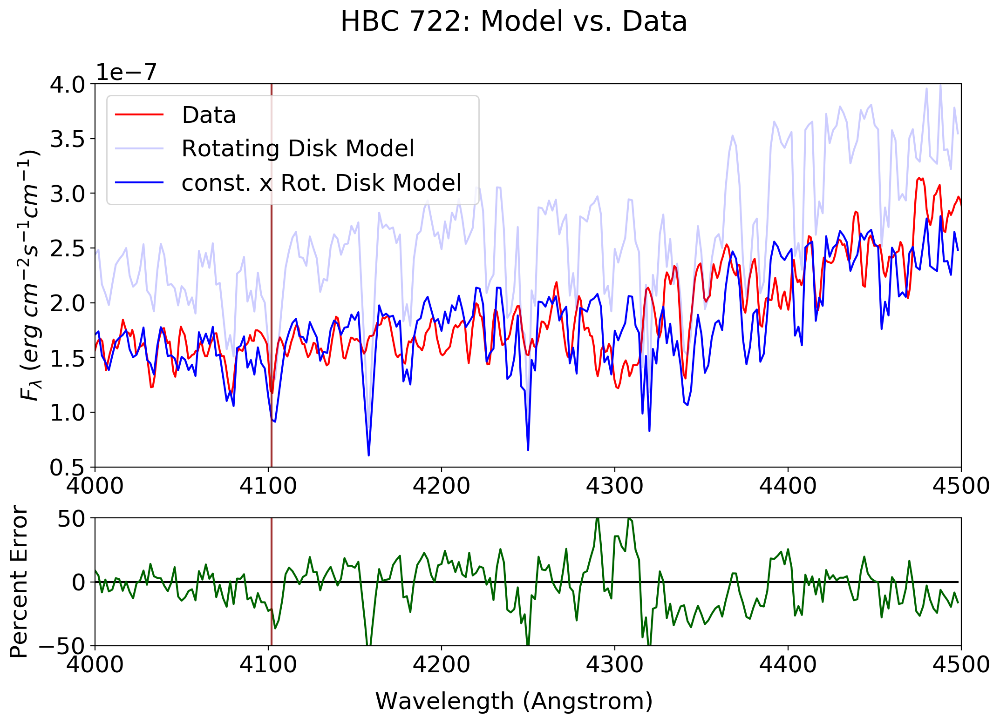

In [107]:
fig=plt.figure(figsize=(12, 8), dpi= 200)
gs = gridspec.GridSpec(2, 1,height_ratios=[3, 1])
plt.rcParams.update({'font.size': 18})

ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax.plot(WAVES_DATA, FLUXES_DATA, 'r-',label='Data')
ax.plot(wav2, flux2, 'b',alpha=0.2,label='Rotating Disk Model')
ax.plot(wav2, 0.7*flux2, 'b', alpha=1,label=r'const. x Rot. Disk Model ')

# ax.axvline(4341, color='darkred', alpha=0.8, label='Wind lines')
ax.axvline(4861, color='darkred', alpha=0.8)
ax.axvline(4102, color='darkred', alpha=0.8)
# ax.axvline(6563, color='darkred', alpha=0.8, label='Wind lines')
# ax2.axvline(6563, color='darkred', alpha=0.8, label='Wind lines')


# ax.axvline(5889, color='darkred', alpha=0.8)
# ax.axvline(5895, color='darkred', alpha=0.8, label='Wind lines')
# ax2.axvline(5889, color='darkred', alpha=0.8)
# ax2.axvline(5895, color='darkred', alpha=0.8)

ax.set_ylim(5e-8, 4e-7)
ax.set_ylabel(r'$ F_\lambda\;(erg \;cm^{-2} s^{-1} cm^{-1})$')

ax.legend()

ax2.plot(wav, np.zeros(len(wav)), 'k-')
ax2.plot(wav, flux_percent2, 'darkgreen')
# ax2.set_title(r'Deviation from avg. $\Delta\; F_\lambda$')
ax2.set_ylabel('Percent Error')
# ax2.axvline(4341, color='darkred', alpha=0.8, label='Wind lines')
ax2.axvline(4861, color='darkred', alpha=0.8)
ax2.axvline(4102, color='darkred', alpha=0.8)

# ax2.legend()
plt.suptitle('HBC 722: Model vs. Data')
fig.text(0.5, 0.04, r'Wavelength (Angstrom)', ha='center')
# fig.text(0.01, 0.5, r'Specific Flux, $ F_\lambda\;(erg \;cm^{-2} s^{-1} cm^{-1})$', va='center', rotation='vertical')
ax.set_xlim(START, END)
ax2.set_xlim(START, END)
ax2.set_ylim(-50, 50)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.show()
# fig.savefig('gaia17bpi_15bad_' + str(START) + '_' + str(END), dpi=200)

# Velocity Offset

In [145]:
CENTRAL = 4922

In [146]:
def tick_function(wave, central):
    v = (wave - central)*c_LIGHT*1e-5/central
    return ["%.0f" % int(z) for z in v]

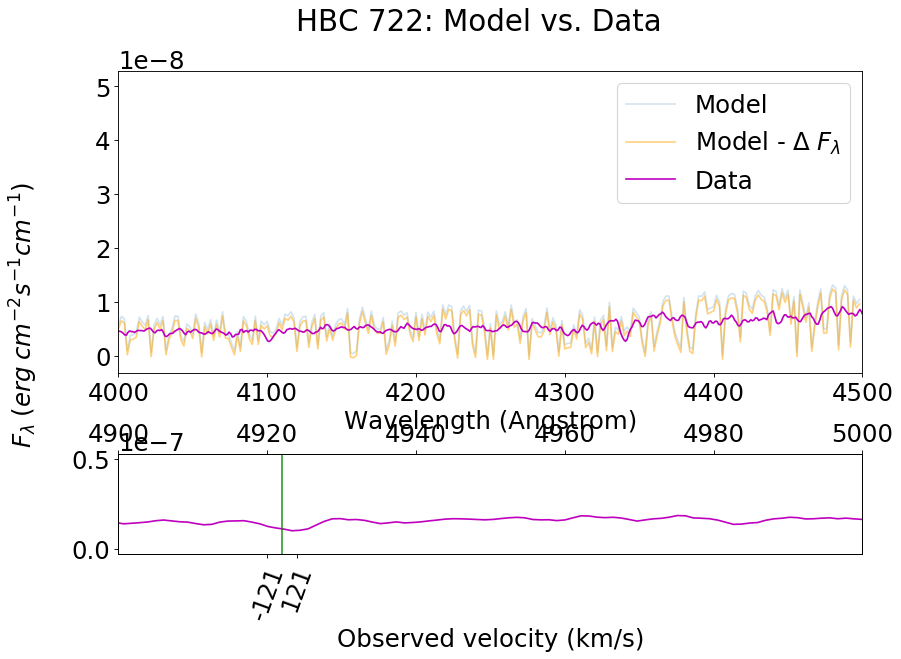

In [147]:
fig=plt.figure(figsize=(12, 8), dpi= 80)
gs = gridspec.GridSpec(2, 1,height_ratios=[3, 1])
plt.subplots_adjust(hspace=0.4)

ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

ax.plot(wav, flux, alpha=0.2,label='Model')
ax.plot(wav, flux_model_scaled, 'orange',alpha=0.5,label=r'Model - $\Delta\; F_\lambda$')

ax.axvline(CENTRAL, color='g', alpha=0.8)

ax.plot(waves_pal, fluxes_pal*1e8, 'm-',label='Data')
ax.set_xlabel('Wavelength (Angstrom)')

ax.legend()

ax2.plot(waves_pal, fluxes_pal*1e8, 'm-',label='Data')
ax2.plot(wav, flux_model_scaled, 'orange',alpha=0.5,label=r'Model - $\Delta\; F_\lambda$')
ax2.axvline(CENTRAL, color='g', alpha=0.8)

# ax.set_ylim(0e-7,8e-7)

ax3 = ax2.twiny()

plt.suptitle('HBC 722: Model vs. Data')
fig.text(0.01, 0.5, r'$F_\lambda\; (erg \;cm^{-2} s^{-1} cm^{-1})$', va='center', rotation='vertical')
ax.set_xlim(START, END)

START_2 = 4900
END_2 = 5000

ax2.set_xlim(START_2, END_2)
ax3.set_xlim(START_2, END_2)
# ax2.set_ylim(3.5e-7, 6.5e-7)
new_tick_locations = np.array([CENTRAL-2, CENTRAL+2])
ax2.set_xticks(new_tick_locations)
ax2.set_xticklabels(tick_function(new_tick_locations, CENTRAL))
ax2.tick_params(axis='x', rotation=70)
ax2.set_xlabel('Observed velocity (km/s)')

plt.show()
# fig.savefig("Surface Gravity Comparison/comparison.png", dpi=140)

## Fractional Fluxes

In [26]:
temp, frac_lums = gaia17bpi_env.viewFracLums(3.7e3, 3.8e3, 0, 'broadened', 'temperature')
temp2, frac_lums2 = gaia17bpi_env.viewFracLums(3.8e3, 3.9e3, 0, 'broadened', 'temperature')
# temp3, frac_lums3 = gaia17bpi_env.viewFracLums(4.2e3, 4.3e3, 2, 'broadened', 'temperature')
# temp4, frac_lums4 = gaia17bpi_env.viewFracLums(4.3e3, 4.4e3, 2, 'broadened', 'temperature')
# temp5, frac_lums5 = gaia17bpi_env.viewFracLums(4.4e3, 4.5e3, 2, 'broadened', 'temperature')

C:\Users\tonyc\OneDrive\Documents\2019 Summer\Jupyter Notebooks\fu_ori_classes_oct11_copy.py:252: RuntimeWarning: invalid value encountered in true_divide
  return temps, (frac_lums/total_lum)*(inner_disk_diff/temps_diff)


C:\Users\tonyc\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':
C:\Users\tonyc\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.


IndexError: list index out of range

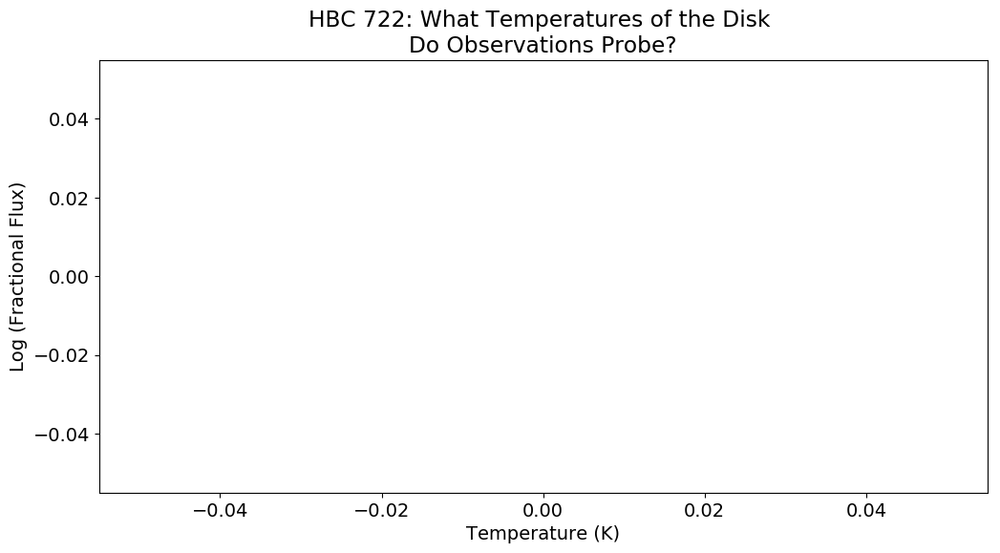

In [27]:
fig=plt.figure(figsize=(12, 6), dpi= 100)
plt.rcParams.update({'font.size': 14})
plt.title('HBC 722: What Temperatures of the Disk \nDo Observations Probe?')
plt.ylabel('Log (Fractional Flux)')
plt.xlabel('Temperature (K)')
# plt.plot(temp5, np.log10(frac_lums5), 'ko-', label=r'4400-4500 $\AA$')
# plt.plot(temp4, np.log10(frac_lums4), 'o-',color='darkred', label=r'4300-4400 $\AA$')
# plt.plot(temp3, np.log10(frac_lums3), 'ro-', label=r'4200-4300 $\AA$')
plt.plot(temp2, np.log10(frac_lums2), 'go-', label=r'3800-3900 $\AA$')
plt.plot(temp, np.log10(frac_lums), 'bo-', label=r'3700-3800 $\AA$')





# plt.axvline(2.898e-3/(4500e-10), color='b', alpha=0.5)
# plt.axvline(2.898e-3/(5500e-10), color='g', alpha=0.5)
# plt.axvline(2.898e-3/(7500e-10), color='r', alpha=0.5)
# plt.axvline(2.898e-3/(20500e-10), color='darkred', alpha=0.5)
# plt.axvline(2.898e-3/(22500e-10), color='k', alpha=0.5)



plt.xlim(gaia17bpi_env.fuori[2].annuli[0].temp+1500, 1000)
plt.ylim(-5.5, -2.7)
plt.legend()
# plt.savefig('frac_flux_mod1_temp_wein.png', dpi=200, bbox_inches='tight')
plt.show()

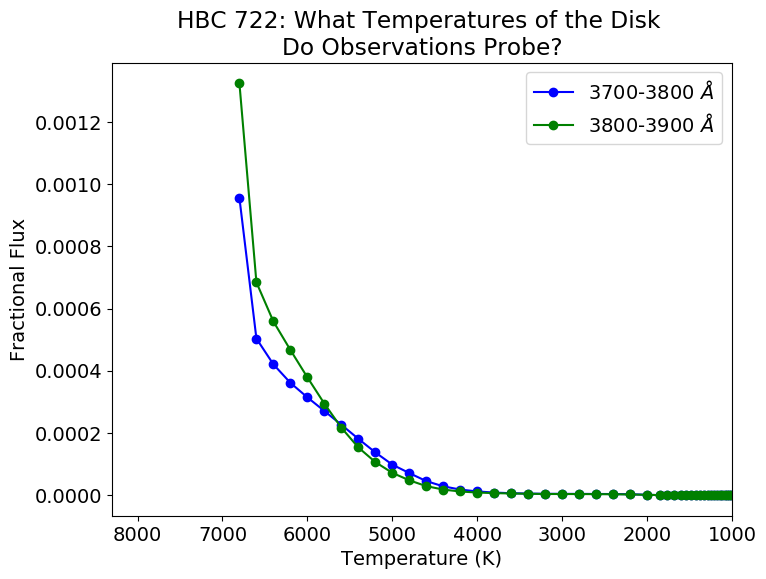

In [51]:
fig=plt.figure(figsize=(8, 6), dpi= 100)
plt.rcParams.update({'font.size': 14})
plt.title('HBC 722: What Temperatures of the Disk \nDo Observations Probe?')
plt.ylabel('Fractional Flux')
plt.xlabel('Temperature (K)')
plt.plot(temp, frac_lums, 'bo-', label=r'3700-3800 $\AA$')
plt.plot(temp2, frac_lums2, 'go-', label=r'3800-3900 $\AA$')
# plt.plot(temp3, np.log10(frac_lums3), 'ro-', label=r'7000-8000 $\AA$')
# plt.plot(temp4, np.log10(frac_lums4), 'o-',color='darkred', label=r'2.0-2.1 $\mu$m')
# plt.plot(temp5, np.log10(frac_lums5), 'ko-', label=r'2.2-2.3 $\mu$m')

# plt.axvline(2.898e-3/(4500e-10), color='b', alpha=0.5)
# plt.axvline(2.898e-3/(5500e-10), color='g', alpha=0.5)
# plt.axvline(2.898e-3/(7500e-10), color='r', alpha=0.5)
# plt.axvline(2.898e-3/(20500e-10), color='darkred', alpha=0.5)
# plt.axvline(2.898e-3/(22500e-10), color='k', alpha=0.5)



plt.xlim(gaia17bpi_env.fuori[0].annuli[0].temp+1500, 1000)
# plt.ylim(-6, -1)
plt.legend()
# plt.savefig('frac_flux_mod1_temp_wein.png', dpi=200, bbox_inches='tight')
plt.show()

### New visualization

Using averages of annuli farther out

(7300.0, 5000)

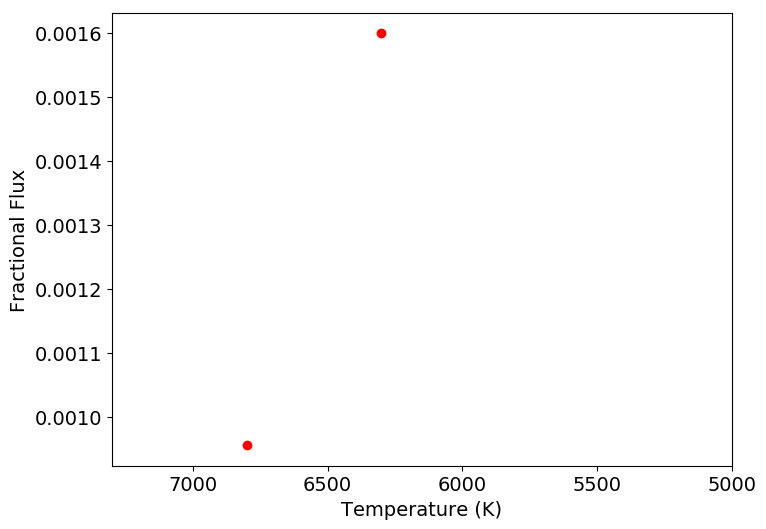

In [67]:
fig=plt.figure(figsize=(8, 6), dpi= 100)
plt.ylabel('Fractional Flux')
plt.xlabel('Temperature (K)')

plt.plot(np.array([temp[0], np.mean(temp[1:5])]), np.array([frac_lums[0], np.sum(frac_lums[1:5])]), 'ro')
plt.xlim(gaia17bpi_env.fuori[0].annuli[0].temp+500, 5000)

In [42]:
frac_lums[1:5]

array([0.00050341, 0.00042055, 0.00036112, 0.00031437])

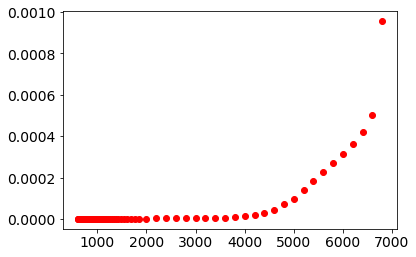

In [41]:
plt.plot(temp, frac_lums, 'ro')

In [28]:
temp, frac_lums = gaia17bpi_env.viewFracLums(3.8e3, 3.9e3, 0, 'broadened', 'distance')
# temp2, frac_lums2 = gaia17bpi_env.viewFracLums(5e3, 6e3, 0, 'broadened', 'distance')
# temp3, frac_lums3 = gaia17bpi_env.viewFracLums(7e3, 8e3, 0, 'broadened', 'distance')
# temp4, frac_lums4 = gaia17bpi_env.viewFracLums(20e3, 21e3, 0, 'broadened', 'distance')
# temp5, frac_lums5 = gaia17bpi_env.viewFracLums(22e3, 23e3, 0, 'broadened', 'distance')

C:\Users\tonyc\OneDrive\Documents\2019 Summer\Jupyter Notebooks\fu_ori_classes_oct11_copy.py:250: RuntimeWarning: invalid value encountered in true_divide
  return r_avg/self.r_star, (frac_lums/total_lum)*(inner_disk_diff/temps_diff)


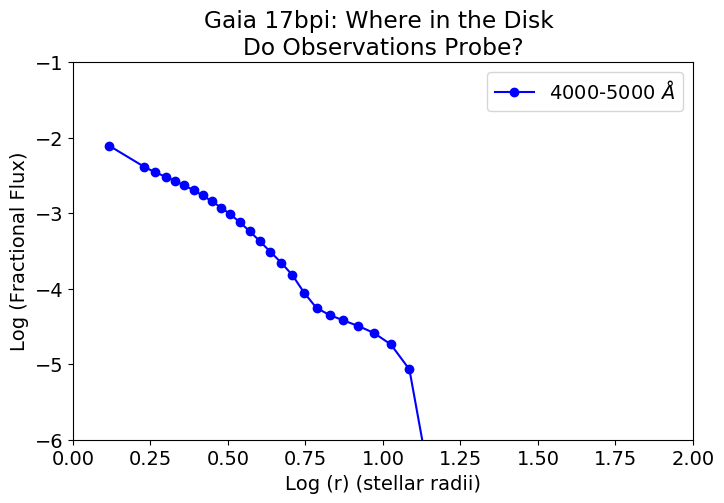

In [34]:
fig=plt.figure(figsize=(8, 5), dpi= 100)
# plt.rcParams.update({'font.size': 20})
plt.title('Gaia 17bpi: Where in the Disk \nDo Observations Probe?')
plt.plot(np.log10(temp), np.log10(frac_lums), 'bo-', label=r'4000-5000 $\AA$')
# plt.plot(np.log10(temp2), np.log10(frac_lums2), 'go-', label=r'5000-6000 $\AA$')
# plt.plot(np.log10(temp3), np.log10(frac_lums3), 'ro-', label=r'7000-8000 $\AA$')
# plt.plot(np.log10(temp4), np.log10(frac_lums4), 'o-',color='darkred', label=r'2.0-2.1 $\mu$m')
# plt.plot(np.log10(temp5), np.log10(frac_lums5), 'ko-', label=r'2.2-2.3 $\mu$m')
plt.ylabel('Log (Fractional Flux)')
plt.xlabel(r'Log (r) (stellar radii)')

plt.xlim(0, 2)
plt.ylim(-6, -1)
plt.legend()
# plt.savefig('frac_flux_mod1_dist.png', dpi=200, bbox_inches='tight')

plt.show()

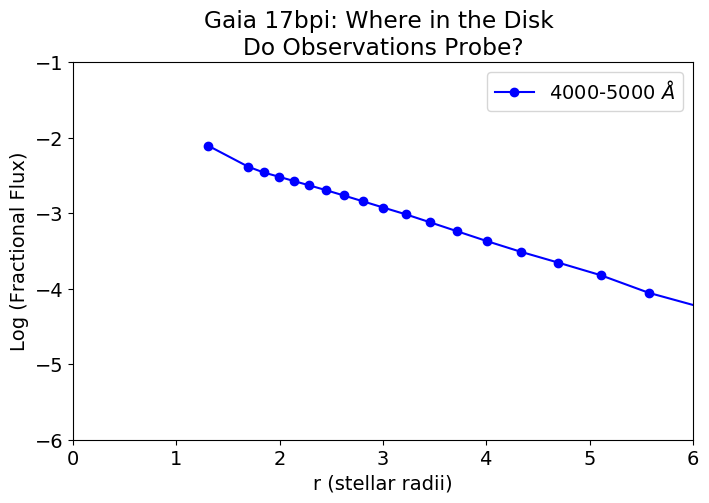

In [35]:
fig=plt.figure(figsize=(8, 5), dpi= 100)
# plt.rcParams.update({'font.size': 20})
plt.title('Gaia 17bpi: Where in the Disk \nDo Observations Probe?')
plt.plot(temp, np.log10(frac_lums), 'bo-', label=r'4000-5000 $\AA$')
# plt.plot(np.log10(temp2), np.log10(frac_lums2), 'go-', label=r'5000-6000 $\AA$')
# plt.plot(np.log10(temp3), np.log10(frac_lums3), 'ro-', label=r'7000-8000 $\AA$')
# plt.plot(np.log10(temp4), np.log10(frac_lums4), 'o-',color='darkred', label=r'2.0-2.1 $\mu$m')
# plt.plot(np.log10(temp5), np.log10(frac_lums5), 'ko-', label=r'2.2-2.3 $\mu$m')
plt.ylabel('Log (Fractional Flux)')
plt.xlabel(r'r (stellar radii)')

plt.xlim(0, 6)
plt.ylim(-6, -1)
plt.legend()
# plt.savefig('frac_flux_mod1_dist.png', dpi=200, bbox_inches='tight')

plt.show()

## Broadening velocity

In [263]:
def viewObsVel(obj_num):
    obj = gaia17bpi_env.fuori[obj_num]
    r_avg = np.zeros(len(obj.annuli))
    vel = np.zeros(len(obj.annuli))
    for i in range(len(obj.annuli)):
        annulus = obj.annuli[i]
        r_avg[i] = (annulus.r_inner + annulus.r_outer)/2
        vel[i]= getObservedVelocity(obj.m_star, r_avg[i], obj.inc)
    print(np.degrees(obj.inc))
    return r_avg/obj.r_star, vel*1e-5 
def viewObsVelMOD(obj_num):
    obj = gaia17bpi_env.fuori[obj_num]
    r_avg = np.zeros(len(obj.annuli))
    for i in range(len(obj.annuli)):
        annulus = obj.annuli[i]
        r_avg[i] = (annulus.r_inner + annulus.r_outer)/2
    vel= getObservedVelocity(0.5*obj.m_star, r_avg, obj.inc)
    print(obj.inc)
    return r_avg/obj.r_star, vel*1e-5 



In [264]:
gaia17bpi_env.fuori[0].annuli[0].r_inner/R_SUN, \
gaia17bpi_env.fuori[0].annuli[0].r_outer/R_SUN,\
gaia17bpi_env.fuori[0].m_star/M_SUN

(2.86, 4.4918501219877225, 0.954992586021436)

In [265]:
rad, vel = viewObsVel(0)


14.999999999999998


In [266]:
np.degrees(0.96)

55.00394833255903

In [267]:
getObservedVelocity(0.4*M_SUN, 12*R_SUN, np.radians(50))*1e-5

61.08892428800383

In [268]:
G, M_SUN, R_SUN/1e10

(6.67259e-08, 1.99e+33, 6.96)

In [269]:
((G*M_SUN/(R_SUN))**(1/2))*1e-5

436.7864312158208

In [270]:
((50*1e5)**2/G) * R_SUN / M_SUN * 3

0.03931180512948415

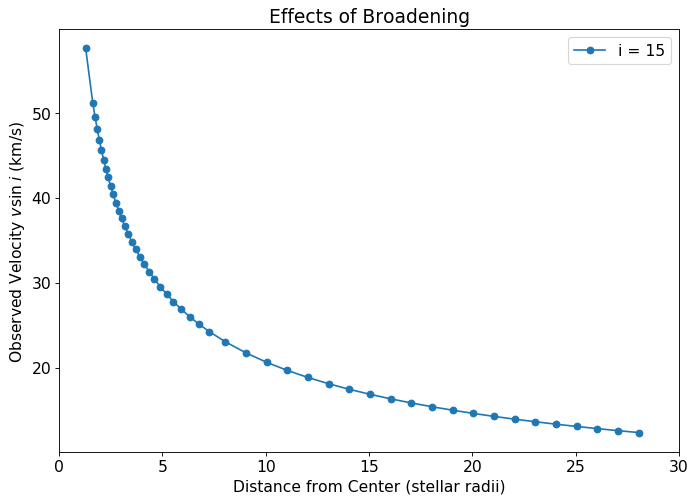

In [271]:
fig=plt.figure(figsize=(10, 7), dpi= 80)
plt.rcParams.update({'font.size': 14})
plt.title('Effects of Broadening')
plt.ylabel(r'Observed Velocity $v\sin \;i$ (km/s) ')
plt.xlabel('Distance from Center (stellar radii)')
plt.plot(rad, vel, 'o-', label='i = 15')
# plt.plot(radMOD, velMOD, 'o-', label='i = 15, modified mass')

# plt.plot(rad2, vel2, 'o-', label='i = 35')



plt.xlim(0, 30)
# plt.ylim(0, 0.001)
plt.legend()
plt.show()

## Comparing different surface gravities

In [51]:

wav, lum = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 0, False, True)
wav2, lum2 = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 1, False, True)

wav0 = wav
lum0 = (lum - lum2)
diff_avg = np.mean(lum0)
lum_percent = (lum0 - diff_avg)/diff_avg

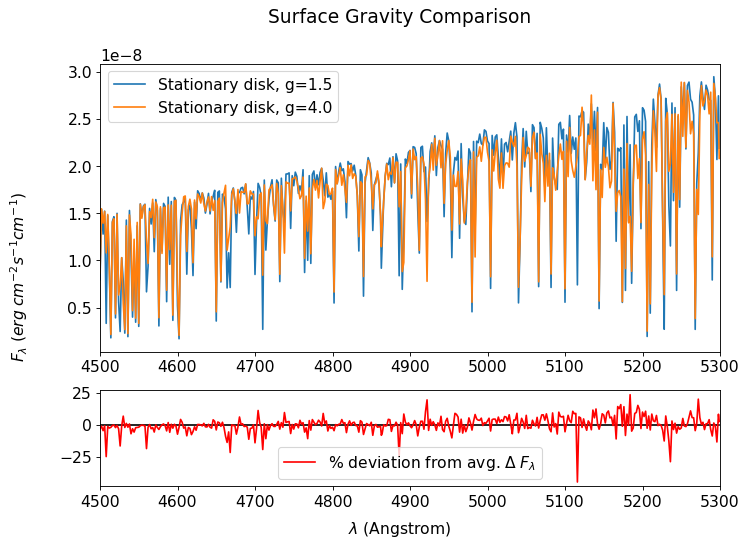

In [53]:
fig=plt.figure(figsize=(10, 7), dpi= 80)
gs = gridspec.GridSpec(2, 1,height_ratios=[3, 1])

ax = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

ax.plot(wav, lum*np.cos(np.radians(10))/(2*np.pi*DIST**2), label='Stationary disk, g=1.5')
ax.plot(wav2, lum2*np.cos(np.radians(10))/(2*np.pi*DIST**2), label='Stationary disk, g=4.0')
# ax.plot(waves_DAT, fluxes_DAT*1e8, 'r--', label='Infrared spectrum')

ax.legend()

ax2.plot(wav0, np.zeros(len(wav0)), 'k-')
ax2.plot(wav0, lum_percent, 'r-', label=r'% deviation from avg. $\Delta\; F_\lambda$')



ax2.legend()
plt.suptitle('Surface Gravity Comparison')
fig.text(0.5, 0.04, r'$\lambda$ (Angstrom)', ha='center')
fig.text(0.01, 0.5, r'$F_\lambda\; (erg \;cm^{-2} s^{-1} cm^{-1})$', va='center', rotation='vertical')
ax.set_xlim(START, END)
ax2.set_xlim(START, END)

plt.show()
# fig.savefig("Surface Gravity Comparison/comparison.png", dpi=140)

In [54]:
waves_print = []

for i in range(4000, 25000, 500):
    waves_print.append((i, i+500))

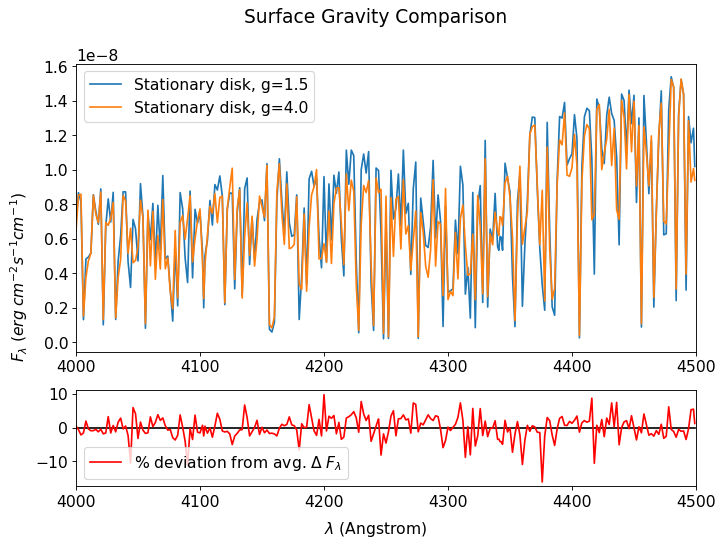

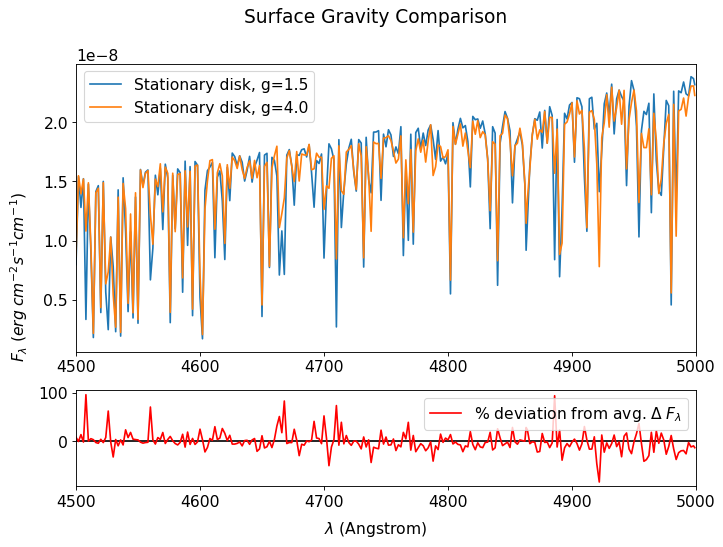

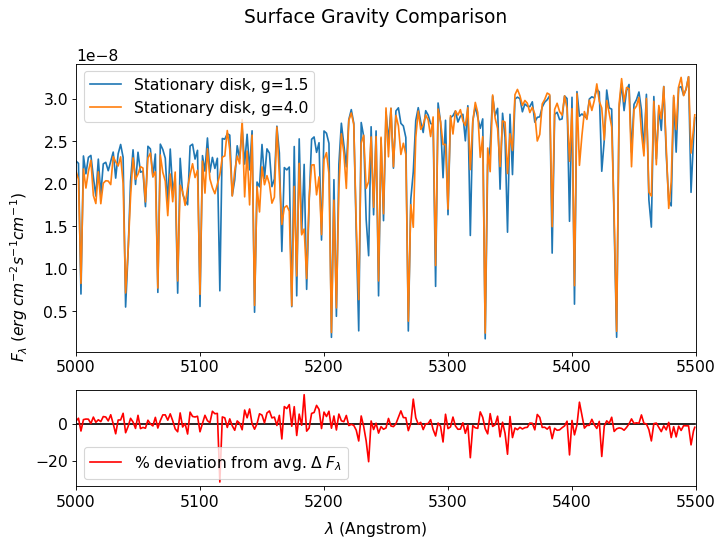

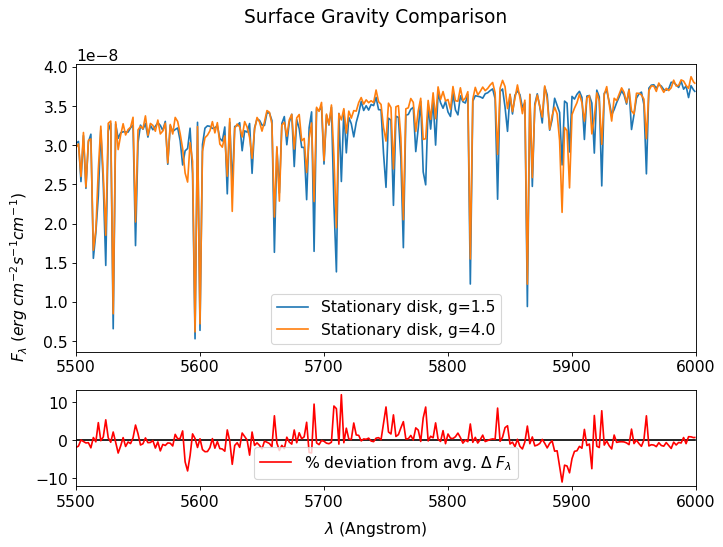

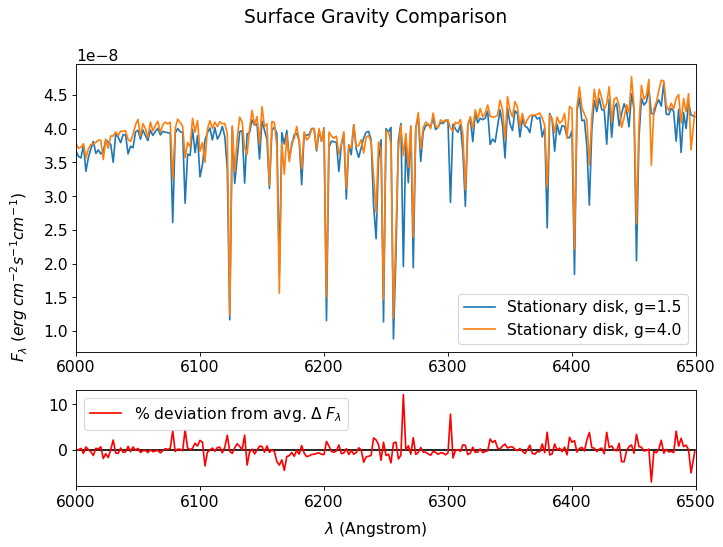

...

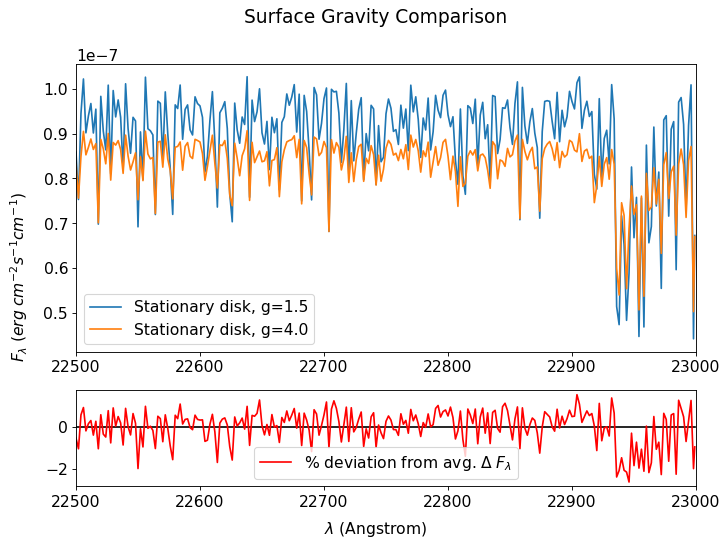

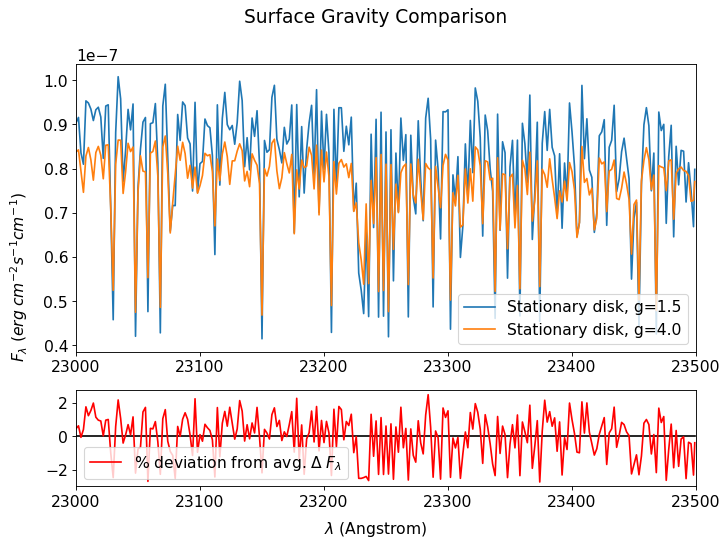

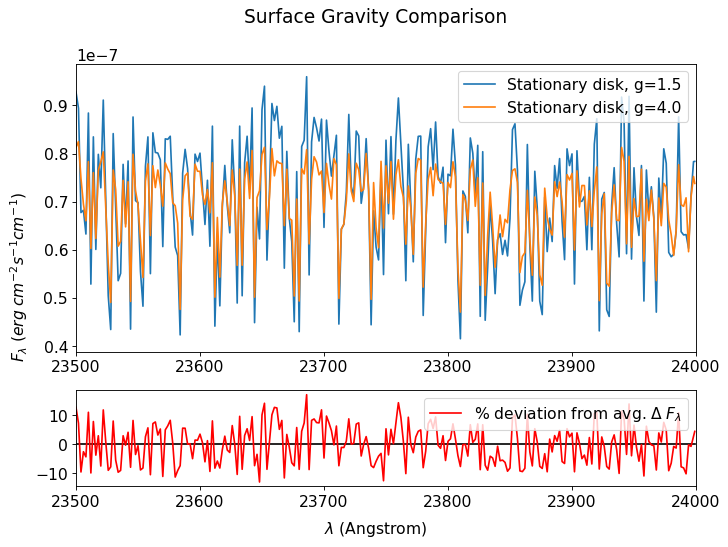

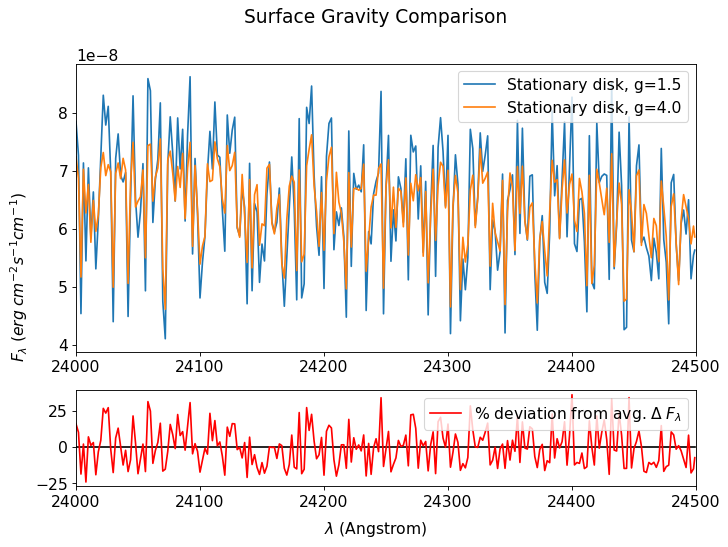

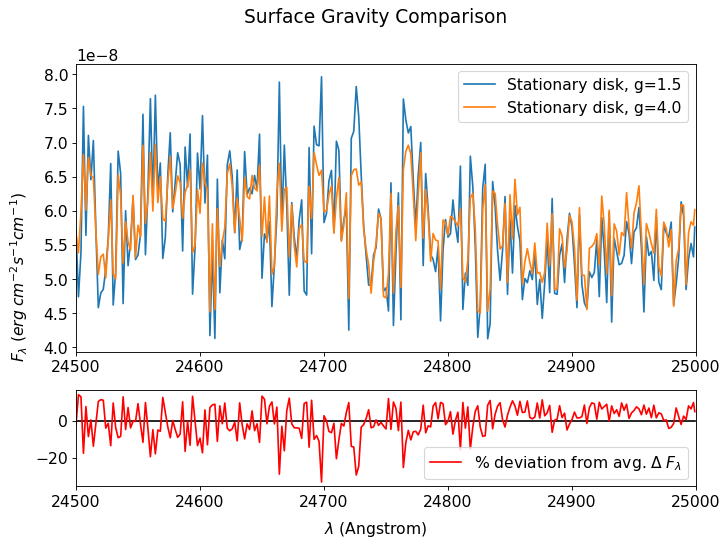

In [55]:
for i,j in waves_print:
    START = i
    END = j
    wav, lum = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 0, False, True)
    wav2, lum2 = gaia17bpi_env.viewModelSpectrum(START, END, 'fu ori', 1, False, True)
    
    wav0 = wav
    lum0 = (lum - lum2)
    diff_avg = np.mean(lum0)
    lum_percent = (lum0 - diff_avg)/diff_avg
    fig=plt.figure(figsize=(10, 7), dpi= 80)
    gs = gridspec.GridSpec(2, 1,height_ratios=[3, 1])

    ax = plt.subplot(gs[0])
    ax2 = plt.subplot(gs[1])

    ax.plot(wav, lum*np.cos(np.radians(10))/(2*np.pi*DIST**2), label='Stationary disk, g=1.5')
    ax.plot(wav2, lum2*np.cos(np.radians(10))/(2*np.pi*DIST**2), label='Stationary disk, g=4.0')
    # ax.plot(waves_DAT, fluxes_DAT*1e8, 'r--', label='Infrared spectrum')

    ax.legend()
    ax2.plot(wav0, np.zeros(len(wav0)), 'k-')
    ax2.plot(wav0, lum_percent, 'r-', label=r'% deviation from avg. $\Delta\; F_\lambda$')


    ax2.legend()
    plt.suptitle('Surface Gravity Comparison')
    fig.text(0.5, 0.04, r'$\lambda$ (Angstrom)', ha='center')
    fig.text(0.04, 0.5, r'$F_\lambda\; (erg \;cm^{-2} s^{-1} cm^{-1})$', va='center', rotation='vertical')
    ax.set_xlim(START, END)
    ax2.set_xlim(START, END)
    plt.show()
    save_string = 'Surface Gravity Comparison/comparison_' + str(START) + '_' + str(END) + '.png'
    fig.savefig(save_string, dpi=140)